In [2]:
#weighted network


In [3]:
!pip install basemap
!pip install basemap-data-hires
!pip install geopandas

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [4]:
import pandas as pd
import networkx as nx
import numpy as np
import matplotlib.pyplot as plt
from geopy.geocoders import ArcGIS
import seaborn as sns
import math
from mpl_toolkits.basemap import Basemap
import geopandas as gpd

In [5]:
G = nx.DiGraph()
N=109

In [50]:
!git clone https://github.com/piklu007mallick/TENCON-22.git

fatal: destination path 'TENCON-22' already exists and is not an empty directory.


In [6]:
data_path = 'TENCON-22'
#fi = pd.read_csv('project_flight_transportation/FINAL.csv',header=None)
#mati=pd.read_csv('project_flight_transportation/matrix.csv',header=None)


In [7]:
data_1= pd.read_csv(r'TENCON-22/Data/Nodes_Position.csv',encoding='cp1252')
data_1


,id,Label,latitude,longitude
0,DEL,Delhi,28.5670,77.103
1,BOM,Mumbai,19.0890,72.868
2,CCU,Kolkata,22.6550,88.447
3,MAA,Chennai,12.9070,80.122
4,IXA,Agartala,23.8870,91.240
...,...,...,...,...
105,PGH,Patnagar,29.0335,79.469
106,DHM2,Kangra,32.1650,76.263
107,VI2B,Meerut,28.9050,77.677
108,IXX,Bidar,17.9080,77.487


In [8]:
lat=data_1['latitude'].values
lon=data_1['longitude'].values
Airport=data_1['Label'].values

In [9]:
a_list=data_1[['Label','latitude','longitude']].values.tolist()
a_list

[['Delhi', 28.567, 77.103],
 ['Mumbai', 19.089, 72.868],
 ['Kolkata', 22.655, 88.447],
 ['Chennai', 12.907, 80.122],
 ['Agartala', 23.887, 91.24],
 ['Agatti', 10.824, 72.176],
 ['Ahmedabad', 23.077, 72.635],
 ['Bhavnagar', 21.752, 72.185],
 ['Porbandar', 21.649, 69.657],
 ['Jamnagar', 22.466, 70.013],
 ['Rajkot', 22.309, 70.78],
 ['Bhuj', 23.288, 69.67],
 ['Kandla', 23.113, 70.1],
 ['Surat', 21.114, 72.742],
 ['Vadodara', 22.336, 73.226],
 ['Aizwal', 23.841, 92.62],
 ['Agra', 27.156, 77.961],
 ['Allahabad', 25.44, 81.734],
 ['Gorakhpur', 26.74, 83.45],
 ['Hindon', 28.708, 77.359],
 ['Kanpur', 26.441, 80.365],
 ['Lucknow', 26.761, 80.889],
 ['Varanasi', 25.452, 82.859],
 ['Adampur', 31.434, 75.759],
 ['Amritsar', 31.71, 74.797],
 ['Bathinda', 30.2715, 74.7458],
 ['Chandigarh', 30.673, 76.789],
 ['Bagdogra', 26.681, 88.329],
 ['Durgapur', 23.583, 87.34],
 ['Bangalore', 12.95, 77.668],
 ['Belgaum', 15.859, 74.618],
 ['Hubli', 15.362, 75.085],
 ['Mangalore', 12.961, 74.89],
 ['Vidyanagar',

In [10]:
type(a_list)

list

In [11]:
for i in a_list :
    G.add_node(i[0], pos=(i[2],i[1]))

In [12]:
# frequency of flight between airport [i,j,x]=> i to j 10 flights per week
data_1= pd.read_csv(r'TENCON-22/Data/FLIGHT_PER_WK_CSV.csv',encoding='cp1252')
stf_list=data_1[['Source','Target','Frequency per week']].values.tolist()
stf_list

[['Bangalore', 'Agartala', 7],
 ['Delhi', 'Agartala', 7],
 ['Guwahati', 'Agartala', 25],
 ['Imphal', 'Agartala', 7],
 ['Kolkata', 'Agartala', 77],
 ['Cochin', 'Agatti', 14],
 ['Aurangabad', 'Ahmedabad', 13],
 ['Bagdogra', 'Ahmedabad', 13],
 ['Bangalore', 'Ahmedabad', 76],
 ['Belgaum', 'Ahmedabad', 7],
 ['Bhavnagar', 'Ahmedabad', 6],
 ['Bhopal', 'Ahmedabad', 14],
 ['Bhubaneshwar', 'Ahmedabad', 7],
 ['Chandigarh', 'Ahmedabad', 27],
 ['Chennai', 'Ahmedabad', 55],
 ['Cochin', 'Ahmedabad', 14],
 ['Dehradun', 'Ahmedabad', 13],
 ['Delhi', 'Ahmedabad', 172],
 ['Diu', 'Ahmedabad', 6],
 ['Goa', 'Ahmedabad', 27],
 ['Guwahati', 'Ahmedabad', 6],
 ['Hubli', 'Ahmedabad', 7],
 ['Hyderabad', 'Ahmedabad', 59],
 ['Indore', 'Ahmedabad', 40],
 ['Jabalpur', 'Ahmedabad', 6],
 ['Jaipur', 'Ahmedabad', 39],
 ['Jaisalmer', 'Ahmedabad', 12],
 ['Jalgaon', 'Ahmedabad', 7],
 ['Jodhpur', 'Ahmedabad', 13],
 ['Kandla', 'Ahmedabad', 13],
 ['Kanpur', 'Ahmedabad', 6],
 ['Kishangarh', 'Ahmedabad', 6],
 ['Kolkata', 'Ahmedab

In [13]:
for i in stf_list :
    G.add_edge(i[0], i[1], weight =i[2])

In [14]:
#longitude latitude of all airport of ANI to get the map
weight1=nx.get_edge_attributes(G,'weight')
pos=nx.get_node_attributes(G,'pos')
pos

{'Delhi': (77.103, 28.567),
 'Mumbai': (72.868, 19.089),
 'Kolkata': (88.447, 22.655),
 'Chennai': (80.122, 12.907),
 'Agartala': (91.24, 23.887),
 'Agatti': (72.176, 10.824),
 'Ahmedabad': (72.635, 23.077),
 'Bhavnagar': (72.185, 21.752),
 'Porbandar': (69.657, 21.649),
 'Jamnagar': (70.013, 22.466),
 'Rajkot': (70.78, 22.309),
 'Bhuj': (69.67, 23.288),
 'Kandla': (70.1, 23.113),
 'Surat': (72.742, 21.114),
 'Vadodara': (73.226, 22.336),
 'Aizwal': (92.62, 23.841),
 'Agra': (77.961, 27.156),
 'Allahabad': (81.734, 25.44),
 'Gorakhpur': (83.45, 26.74),
 'Hindon': (77.359, 28.708),
 'Kanpur': (80.365, 26.441),
 'Lucknow': (80.889, 26.761),
 'Varanasi': (82.859, 25.452),
 'Adampur': (75.759, 31.434),
 'Amritsar': (74.797, 31.71),
 'Bathinda': (74.7458, 30.2715),
 'Chandigarh': (76.789, 30.673),
 'Bagdogra': (88.329, 26.681),
 'Durgapur': (87.34, 23.583),
 'Bangalore': (77.668, 12.95),
 'Belgaum': (74.618, 15.859),
 'Hubli': (75.085, 15.362),
 'Mangalore': (74.89, 12.961),
 'Vidyanagar': 

In [15]:
print(weight1)

{('Delhi', 'Agartala'): 7, ('Delhi', 'Ahmedabad'): 172, ('Delhi', 'Rajkot'): 14, ('Delhi', 'Surat'): 42, ('Delhi', 'Vadodara'): 49, ('Delhi', 'Allahabad'): 28, ('Delhi', 'Gorakhpur'): 14, ('Delhi', 'Kanpur'): 7, ('Delhi', 'Lucknow'): 147, ('Delhi', 'Varanasi'): 127, ('Delhi', 'Adampur'): 7, ('Delhi', 'Amritsar'): 87, ('Delhi', 'Bathinda'): 3, ('Delhi', 'Chandigarh'): 167, ('Delhi', 'Bagdogra'): 69, ('Delhi', 'Durgapur'): 7, ('Delhi', 'Kolkata'): 278, ('Delhi', 'Bangalore'): 321, ('Delhi', 'Mangalore'): 14, ('Delhi', 'Bhopal'): 55, ('Delhi', 'Gwalior'): 3, ('Delhi', 'Indore'): 81, ('Delhi', 'Jabalpur'): 14, ('Delhi', 'Bhubaneshwar'): 58, ('Delhi', 'Jharsuguda'): 7, ('Delhi', 'Calicut'): 7, ('Delhi', 'Cochin'): 56, ('Delhi', 'Kannur'): 7, ('Delhi', 'Trivandrum'): 14, ('Delhi', 'Chennai'): 170, ('Delhi', 'Coimbatore'): 35, ('Delhi', 'Madurai'): 7, ('Delhi', 'Dehradun'): 59, ('Delhi', 'Dibrugarh'): 16, ('Delhi', 'Guwahati'): 107, ('Delhi', 'Silchar'): 7, ('Delhi', 'Gaya'): 7, ('Delhi', 'Pa

In [60]:
city=gpd.read_file("TENCON-22/India_State_Shapefile/India_State_Boundary.shp")

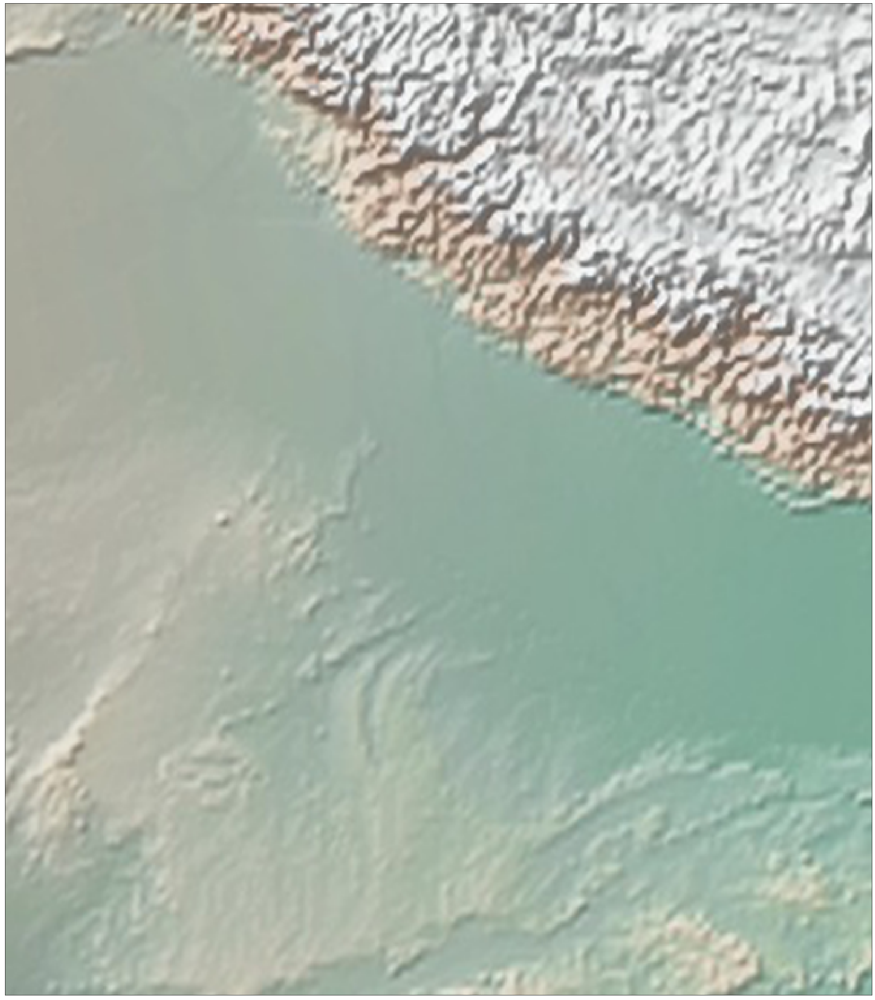

In [17]:
fig = plt.figure(figsize=(40, 40))
m = Basemap(projection='lcc', resolution='h', 
            lat_0=27.891535, lon_0=78.078743,
            width=1.05E6, height=1.2E6)
m.shadedrelief(scale=2)

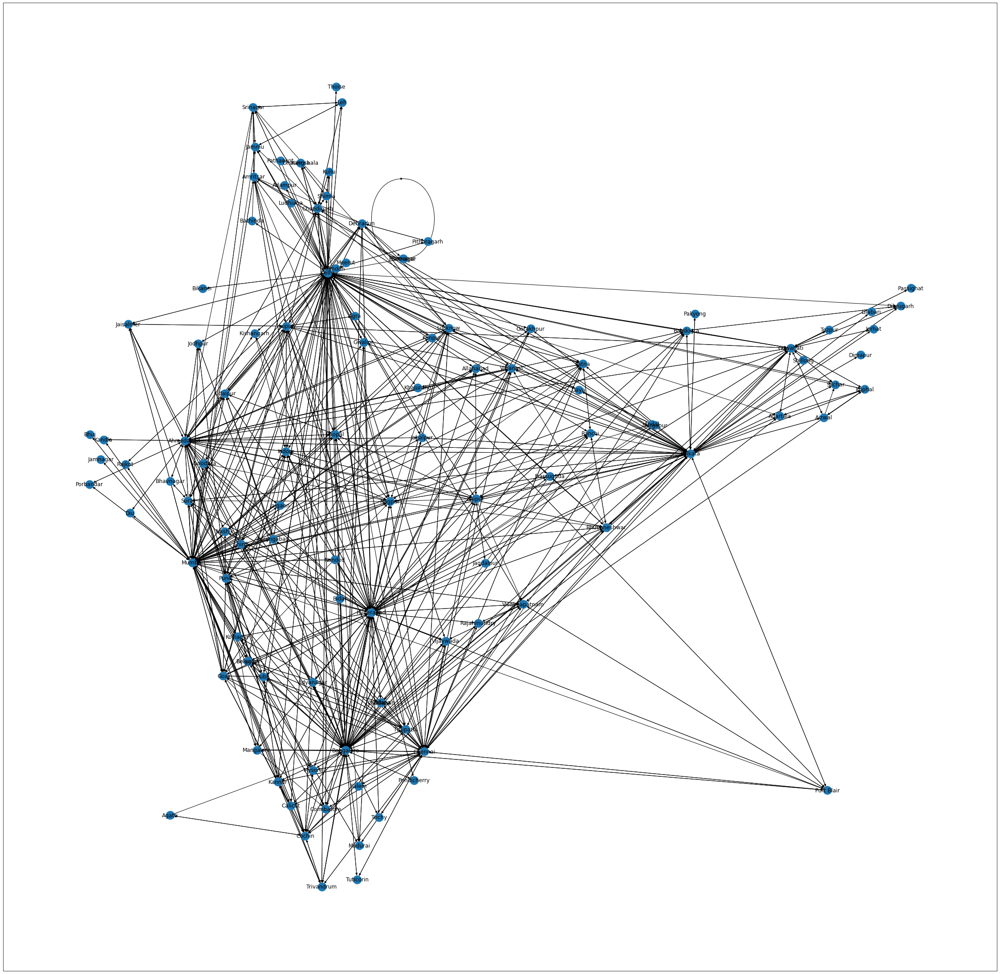

In [16]:
#indian map
cmap = plt.cm.Accent
plt.rcParams["figure.figsize"] = (40,40)
nx.draw_networkx(G, pos = pos, with_labels=True, node_size=350, vmin=0.0,vmax=2.0, cmap=cmap)
plt.savefig('network_position.pdf') 

In [17]:
plt.rcParams["figure.figsize"] = (100,100)
for i in a_list :
    degree_0=G.in_degree(i[0],'weight')
    if degree_0>=2000:
        nx.draw_networkx(G, pos = pos, with_labels=True,node_color="tab:red",node_size=4000)
    else :
        nx.draw_networkx(G, pos = pos, with_labels=True,node_size=4000)
#plt.savefig('network_position.pdf') 

Error in callback <function flush_figures at 0x7fa6cb443200> (for post_execute):


KeyboardInterrupt: ignored

In [ ]:
# not nedded
"""plt.rcParams["figure.figsize"] = (40,20)
nx.draw_kamada_kawai(G,with_labels = True)
plt.savefig('network_image.pdf') """

'plt.rcParams["figure.figsize"] = (40,20)\nnx.draw_kamada_kawai(G,with_labels = True)\nplt.savefig(\'network_image.pdf\') '

In [ ]:
# not nedded
"""plt.rcParams["figure.figsize"] = (40,20)
nx.draw_circular(G,with_labels = True)"""

'plt.rcParams["figure.figsize"] = (40,20)\nnx.draw_circular(G,with_labels = True)'

In [ ]:
# not nedded
"""plt.rcParams["figure.figsize"] = (40,20)
nx.draw_random(G,with_labels = True)
plt.savefig('network_random.pdf') """

'plt.rcParams["figure.figsize"] = (40,20)\nnx.draw_random(G,with_labels = True)\nplt.savefig(\'network_random.pdf\') '

In [1]:
#In Degree of each node
list_1=[]
for i in a_list :
    degree_1=G.in_degree(i[0],'weight')
    list_1.append(degree_1)
    print(i[0], "has in-degree", degree_1)
len(list_1)

total_in_degree=sum(list_1)
print('Total indegree of ANI',total_in_degree)
sum_top_4_node=2527+2577+1812+1631;
percen_in_degree_of_top_4_node=((sum_top_4_node/total_in_degree)*100)
print("% of top 4 airport compared to entire network",percen_in_degree_of_top_4_node)

NameError: ignored

In [2]:
# Avarage degree of Network
print("List of In degree",list_1)
total=0
for ele in range(0, len(list_1)):
    total = total + list_1[ele]
print("Sum of all elements in given list: ", total)  #sum of in degree
avg_degree=total/len(list_1)
print("Avarage degree of Network",avg_degree)

List of In degree []
Sum of all elements in given list:  0


ZeroDivisionError: ignored

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:8: UserWarning: In Matplotlib 3.3 individual lines on a stem plot will be added as a LineCollection instead of individual lines. This significantly improves the performance of a stem plot. To remove this warning and switch to the new behaviour, set the "use_line_collection" keyword argument to True.
  


degree :  (2577, 2527, 2421, 1892, 1812, 1631, 929, 571, 568, 505, 468, 425, 410, 384, 358, 333, 306, 294, 282, 265, 257, 255, 226, 225, 196, 177, 173, 160, 158, 156, 152, 150, 146, 144, 123, 116, 112, 107, 103, 96, 92, 91, 90, 89, 77, 76, 70, 63, 62, 56, 55, 50, 47, 42, 39, 35, 33, 28, 27, 24, 22, 21, 20, 19, 14, 13, 12, 11, 10, 8, 7, 6, 4, 3, 2, 0)
repetition :  (1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 3, 2, 2, 2, 3, 1, 1, 1, 1, 1, 2, 6, 2, 3, 1, 1, 1, 8, 1, 2, 2, 1, 9)


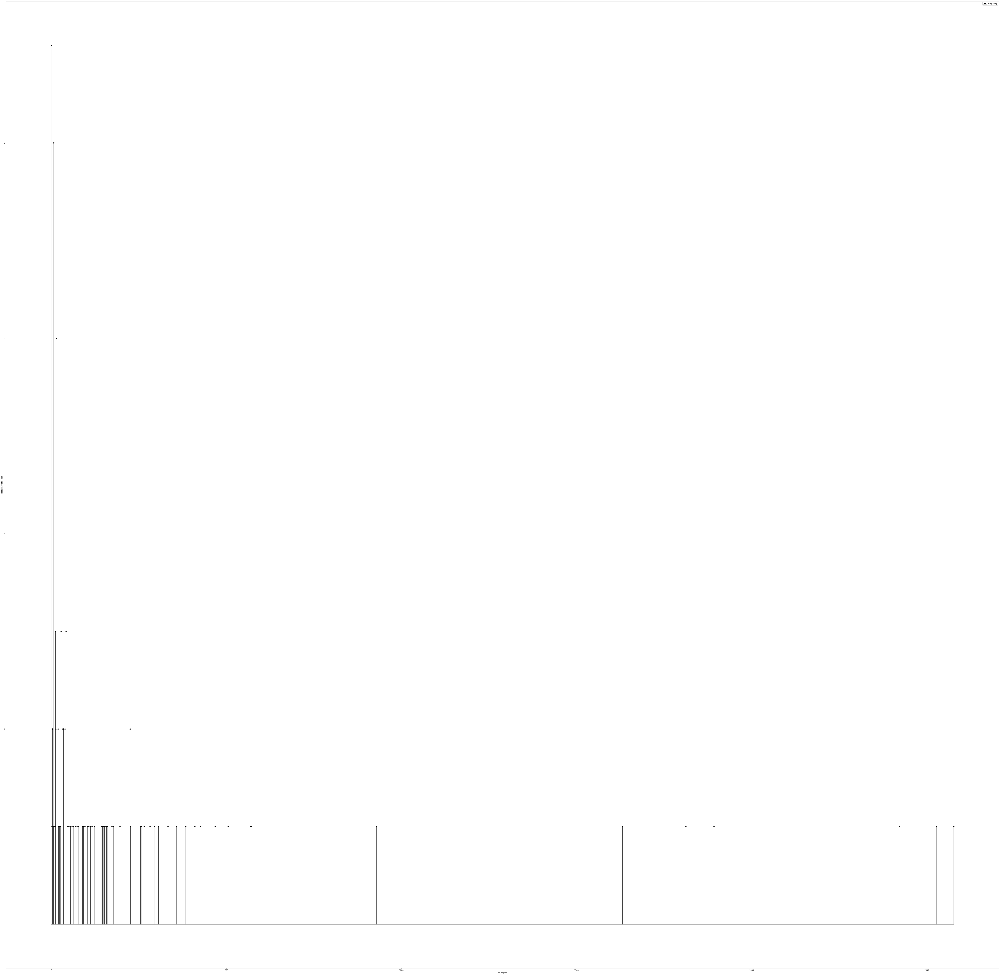

In [65]:
#weighted In degree distribution # no need later it has drawn 
import collections
degree_sequence=sorted([d for n,d in G.in_degree(weight='weight')],reverse=True)
degreeCount=collections.Counter(degree_sequence)
deg, cnt=zip(*degreeCount.items())   #cnt=list of the number of presence of a degree in network  
fig, ax=plt.subplots()               #deg=list of all degree in network 
#plt.bar(deg, cnt, width=20, color="r")
plt.stem(deg, cnt,linefmt='k-', markerfmt='ko', basefmt='k-')
#plt.title('Degree Distribution')
plt.xlabel('In-degree')
plt.ylabel('Frequency of nodes')
plt.legend(['Frequency'])
plt.savefig('in-degree distribution.pdf') 
print("degree : ",deg)
print("repetition : ",cnt)

In [66]:
import pandas as pd
df = pd.DataFrame(deg)
df.head()

,0
0,2577
1,2527
2,2421
3,1892
4,1812


In [45]:
df.to_excel('In_degree.xls')

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: FutureWarning: As the xlwt package is no longer maintained, the xlwt engine will be removed in a future version of pandas. This is the only engine in pandas that supports writing in the xls format. Install openpyxl and write to an xlsx file instead. You can set the option io.excel.xls.writer to 'xlwt' to silence this warning. While this option is deprecated and will also raise a warning, it can be globally set and the warning suppressed.
  """Entry point for launching an IPython kernel.


In [ ]:
"""#scatter plot #####not needed
plt.scatter(deg, cnt)
plt.show()"""

'#scatter plot #####not needed\nplt.scatter(deg, cnt)\nplt.show()'

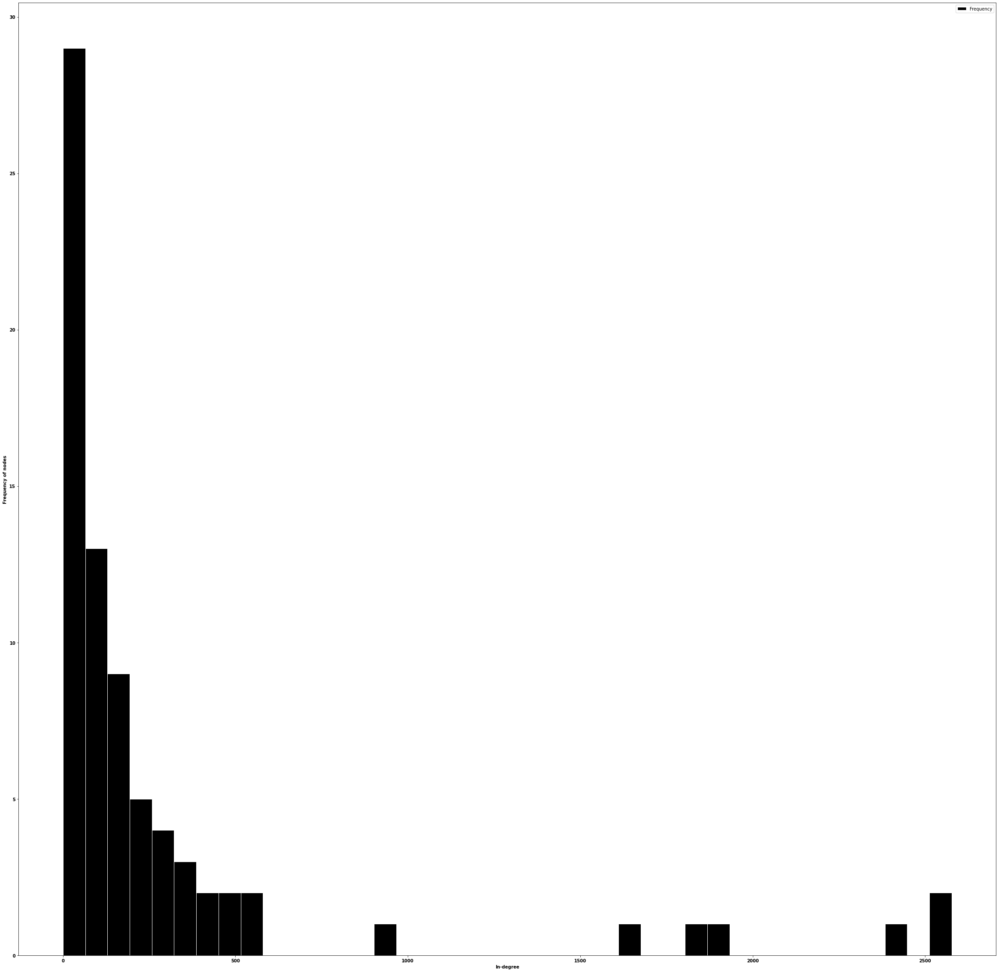

In [23]:
# in degree distribution
# repetation of number of flight per week

plt.hist(deg, bins=40,color='black',edgecolor='white')

plt.xlabel('In-degree',fontname='Times New Roman',weight="bold")
plt.ylabel('Frequency of nodes',fontname='Times New Roman',weight="bold")
plt.legend(['Frequency'])
plt.savefig('in-degree distribution.pdf') 
plt.yticks(weight="bold")
plt.xticks(weight="bold")
plt.show()

In [ ]:
"""df = sns.load_dataset('iris')
sns.distplot(df[deg],kde = False)"""

"df = sns.load_dataset('iris')\nsns.distplot(df[deg],kde = False)"

In [ ]:
"""deg=deg[:-1]
cnt=cnt[:-1]
log_deg=[]
log_cnt=[]
for inti in range(len(deg)):
    log_d=math.log10(deg[inti])
    log_deg.append(log_d)
    log_c=math.log10(cnt[inti])
    log_cnt.append(log_c)
plt.plot(log_deg,log_cnt,'r-o')
plt.show()"""

"deg=deg[:-1]\ncnt=cnt[:-1]\nlog_deg=[]\nlog_cnt=[]\nfor inti in range(len(deg)):\n    log_d=math.log10(deg[inti])\n    log_deg.append(log_d)\n    log_c=math.log10(cnt[inti])\n    log_cnt.append(log_c)\nplt.plot(log_deg,log_cnt,'r-o')\nplt.show()"

In [24]:
pip install powerlaw

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


Values less than or equal to 0 in data. Throwing out 0 or negative values


Calculating best minimal value for power law fit
2.2424160298090836 0.024934496749058992
alpha value 2.0191789426370974


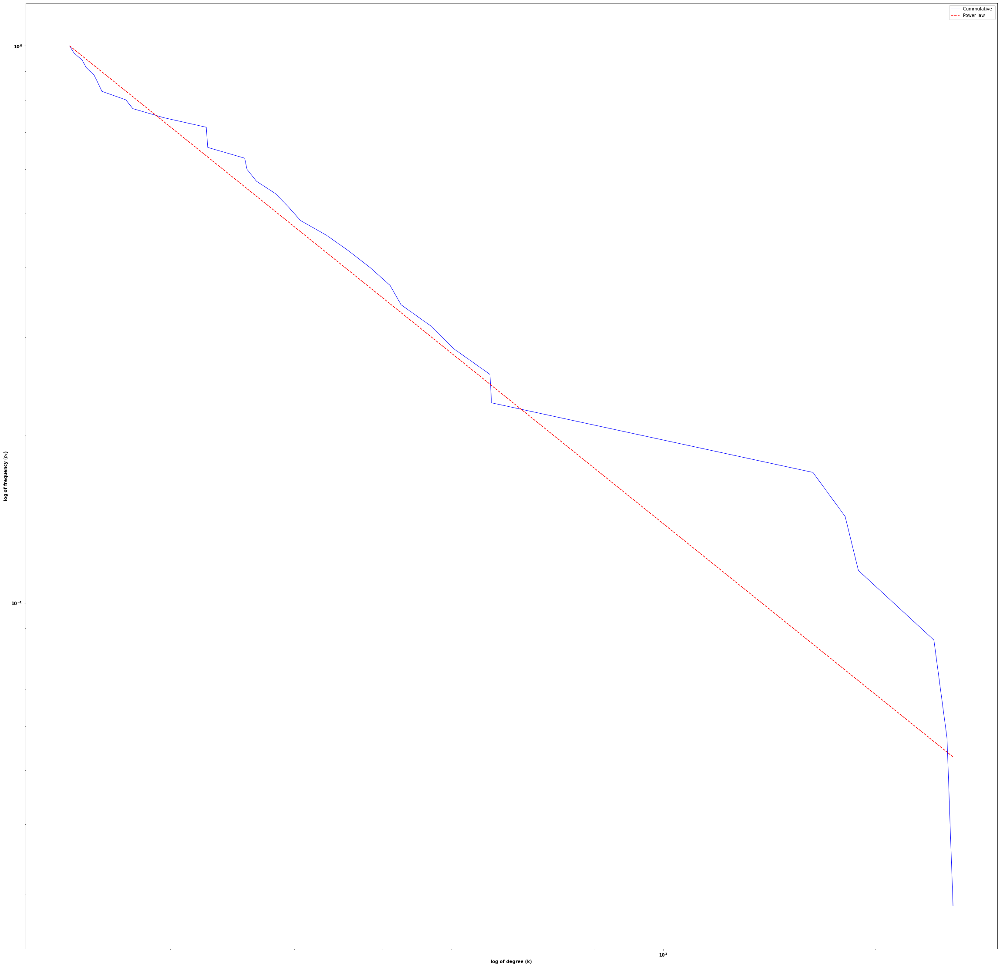

In [32]:
# Cummulative degree distribution and power-law approximation
import powerlaw 
fit = powerlaw.Fit(degree_sequence)
R, p = fit.distribution_compare('power_law', 'exponential', normalized_ratio=True)
print (R, p)
fig, ax=plt.subplots()
fit.distribution_compare('power_law', 'lognormal')
fig4 = fit.plot_ccdf(linewidth=1, color='blue')
fit.power_law.plot_ccdf(ax=fig4, color='r', linestyle='--') #powerlaw

plt.xlabel('log of degree (k)',fontname='Times New Roman',weight="bold")
plt.ylabel('log of frequency $(p_{k}$)',fontname='Times New Roman',weight="bold") #$Y_{axis}$
plt.legend(['Cummulative ','Power law'])
plt.yticks(weight="bold")
plt.xticks(weight="bold")
print('alpha value',fit.power_law.alpha)
plt.savefig('power law.png') 
###########                           STOP HERE
###########                           STOP HERE
###########                           STOP HERE
############################################################################################

##########################################################




###########                           STOP HERE




##########                       Run Networkx_2 for other simulation

In [33]:
# Average Shortest Path of unweighted graph
avg_shortest_path=nx.average_shortest_path_length(G, weight=None)#, method=None)
print(avg_shortest_path)

2.0079232693911595


In [34]:
#data taking between airport for table 1 (shortest path)
from collections import defaultdict
list_wt_1_element=[]
list_wt_2_element=[]
list_wt_3_element=[]
list_wt_4_element=[]
list_wt_5_element=[]
##


list_wt_6_element=[]
for i in a_list:
    for j in a_list: 
       # print([p for p in nx.all_shortest_paths(G, source=i[0], target=j[0])])
        try:   
            shtst_pat_list=([p for p in nx.all_shortest_paths(G, source=i[0], target=j[0])])
            print('source and destination',shtst_pat_list)
            count = 0
            for listElem in shtst_pat_list:
                count += len(listElem)                    
                print('Total Number of elements : ', count)
                if count == 1:
                    list_wt_1_element.append(count)
                if count == 2:
                    list_wt_2_element.append(count)  
                if count == 3:
                    list_wt_3_element.append(count)
                if count == 4:
                    list_wt_4_element.append(count)
                if count == 5:
                    list_wt_5_element.append(count)
                
        except nx.exception.NetworkXNoPath:
            continue
print("Number of path with shortest path lenght 1 :",len(list_wt_1_element))
print("Number of path with shortest path lenght 2 :",len(list_wt_2_element))
print("Number of path with shortest path lenght 3 :",len(list_wt_3_element))
print("Number of path with shortest path lenght 4 :",len(list_wt_4_element))
print("Number of path with shortest path lenght 5 :",len(list_wt_5_element))
#print("Number of path with shortest path lenght 3 :",len(list_wt_6_element))







Streaming output truncated to the last 5000 lines.
Total Number of elements :  2
source and destination [['Shimla', 'Kullu']]
Total Number of elements :  2
source and destination [['Shimla']]
Total Number of elements :  1
source and destination [['Shimla', 'Chandigarh', 'Ahmedabad', 'Diu'], ['Shimla', 'Delhi', 'Ahmedabad', 'Diu'], ['Shimla', 'Chandigarh', 'Mumbai', 'Diu'], ['Shimla', 'Delhi', 'Mumbai', 'Diu']]
Total Number of elements :  4
Total Number of elements :  8
Total Number of elements :  12
Total Number of elements :  16
source and destination [['Shimla', 'Chandigarh', 'Leh'], ['Shimla', 'Delhi', 'Leh']]
Total Number of elements :  3
Total Number of elements :  6
source and destination [['Shimla', 'Delhi', 'Thoise']]
Total Number of elements :  3
source and destination [['Shimla', 'Delhi', 'Guwahati', 'Passighat']]
Total Number of elements :  4
source and destination [['Shimla', 'Chandigarh', 'Kolkata', 'Pakyong'], ['Shimla', 'Delhi', 'Kolkata', 'Pakyong']]
Total Number of ele

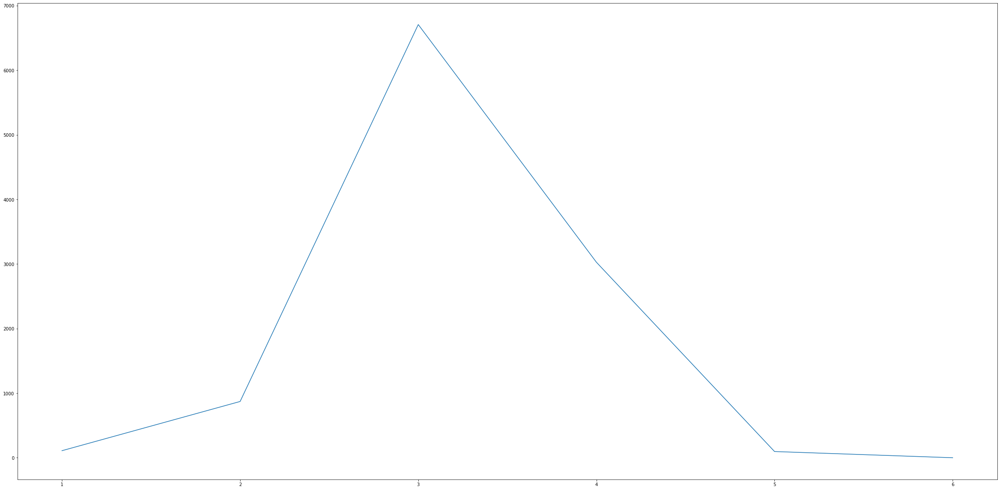

In [ ]:
#Shortest path distribution # branch weight not considered
list_path=[1,2,3,4,5,6]
list_shortest_path=[109,871,6707,3027,96,0]
plt.plot(list_path,list_shortest_path)
plt.show()

In [35]:
#average clustering coefficient of our nw and random nw
avg_clster=nx.average_clustering(G, weight='weight', count_zeros=True)
avg_clster_rndm=avg_shortest_path/N
print('Average Clustering coff of our network',avg_clster)
print('Average Clustering coff of random network',avg_clster_rndm)

Average Clustering coff of our network 0.03372370566493121
Average Clustering coff of random network 0.018421314398084032


In [36]:
dict_1=(nx.clustering(G,weight='weight'))
keys, values = zip(*dict_1.items())

#print(keys)
degree_1=G.in_degree(keys,'weight')


df = pd.DataFrame(list(dict_1.items()))
df.drop(df.tail(1).index,inplace=True) 
df['degree_1'] = list_1
df
df.sort_values(by=[1])
#plt.figure(
df.plot(x='degree_1', y=1, style='o')
print(values)

ValueError: ignored

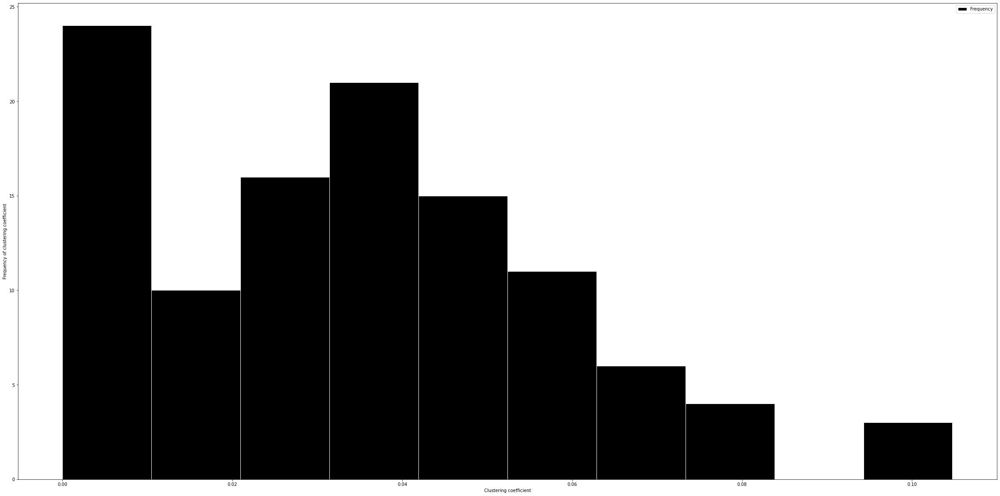

In [ ]:
"""plt.hist(values, bins=10,color='black',edgecolor='white')
plt.xlabel('Clustering coefficient')
plt.ylabel('Frequency of clustering coefficient')
plt.legend(['Frequency'])
plt.savefig('clustering coeff.pdf') 
plt.show()"""

0.10496804119301958


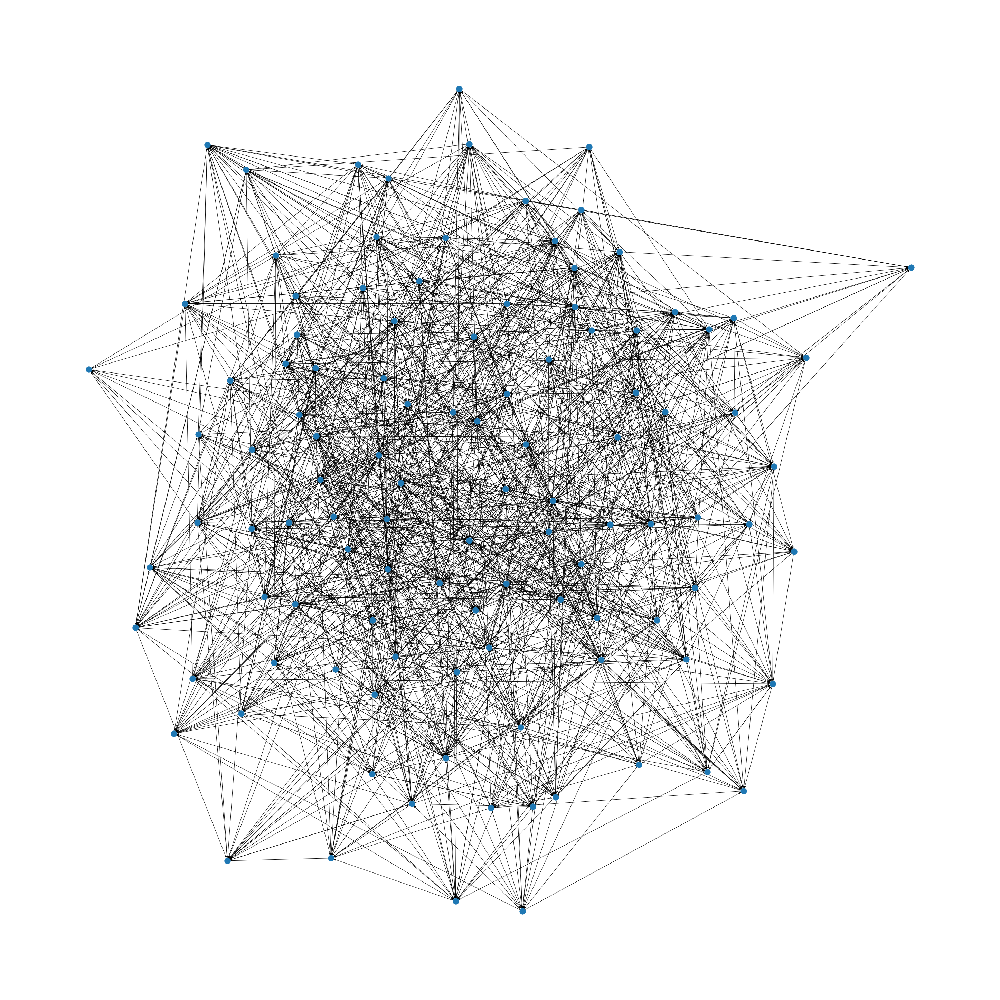

In [37]:
G2=nx.erdos_renyi_graph(109, 0.1, seed=None, directed=True)
print(nx.average_clustering(G2, weight='weight', count_zeros=True))
plt.figure()
nx.draw(G2)

In [38]:
from collections import defaultdict
list_wt_1_element=[]
list_wt_2_element=[]
list_wt_3_element=[]
list_wt_4_element=[]
list_wt_5_element=[]
##


list_wt_6_element=[]
for i in a_list:
    for j in a_list: 
       # print([p for p in nx.all_shortest_paths(G, source=i[0], target=j[0])])
        try:   
            shtst_pat_list=([p for p in nx.all_shortest_paths(G, source=i[0], target=j[0])])
            print(shtst_pat_list)
            print("no. of list",len(shtst_pat_list))
            count = 0
            for listElem in shtst_pat_list:
                count += len(listElem)                    
                print('Total Number of elements : ', count)
                if count == 3:
                    if count == [6,9,12,15,18,21,24,27,30]:
                        list_wt_3_element.append([count]*len(shtst_pat_list))
                else :
                    list_wt_3_element.append(count)
                
        except nx.exception.NetworkXNoPath:
            continue

print("Number of path with shortest path lenght 3 :",len(list_wt_3_element))


Streaming output truncated to the last 5000 lines.
Total Number of elements :  4
Total Number of elements :  8
Total Number of elements :  12
Total Number of elements :  16
Total Number of elements :  20
[['Passighat', 'Guwahati', 'Bhubaneshwar']]
no. of list 1
Total Number of elements :  3
[['Passighat', 'Guwahati', 'Kolkata', 'Jharsuguda'], ['Passighat', 'Guwahati', 'Bhubaneshwar', 'Jharsuguda'], ['Passighat', 'Guwahati', 'Delhi', 'Jharsuguda'], ['Passighat', 'Guwahati', 'Hyderabad', 'Jharsuguda']]
no. of list 4
Total Number of elements :  4
Total Number of elements :  8
Total Number of elements :  12
Total Number of elements :  16
[['Passighat', 'Guwahati', 'Bangalore', 'Calicut'], ['Passighat', 'Guwahati', 'Chennai', 'Calicut'], ['Passighat', 'Guwahati', 'Delhi', 'Calicut'], ['Passighat', 'Guwahati', 'Mumbai', 'Calicut']]
no. of list 4
Total Number of elements :  4
Total Number of elements :  8
Total Number of elements :  12
Total Number of elements :  16
[['Passighat', 'Guwahati',

In [39]:
#bet_centrality=nx.betweenness_centrality(G, k=None, normalized=True, weight="weight")
bet_centrality=nx.betweenness_centrality(G, k=None, normalized=False, weight="weight")
bet_centrality

{'Delhi': 2726.9916666666663,
 'Mumbai': 1641.1825396825388,
 'Kolkata': 1034.1984126984125,
 'Chennai': 590.0,
 'Agartala': 43.5,
 'Agatti': 0.0,
 'Ahmedabad': 1023.2777777777775,
 'Bhavnagar': 13.5,
 'Porbandar': 0.0,
 'Jamnagar': 0.0,
 'Rajkot': 0.0,
 'Bhuj': 0.0,
 'Kandla': 0.0,
 'Surat': 104.17777777777779,
 'Vadodara': 0.0,
 'Aizwal': 23.5,
 'Agra': 39.5,
 'Allahabad': 21.2,
 'Gorakhpur': 149.17857142857144,
 'Hindon': 165.5,
 'Kanpur': 44.91666666666668,
 'Lucknow': 154.6952380952381,
 'Varanasi': 242.21666666666667,
 'Adampur': 0.0,
 'Amritsar': 252.53809523809522,
 'Bathinda': 123.16666666666667,
 'Chandigarh': 684.1333333333333,
 'Bagdogra': 159.5888888888889,
 'Durgapur': 0.0,
 'Bangalore': 1380.391666666667,
 'Belgaum': 436.09999999999997,
 'Hubli': 800.0055555555554,
 'Mangalore': 69.2,
 'Vidyanagar': 0.0,
 'Mysore': 20.283333333333335,
 'Bhopal': 114.28571428571429,
 'Gwalior': 1413.0285714285717,
 'Indore': 545.7333333333333,
 'Khajuraho': 0.0,
 'Jabalpur': 2.5,
 'Bhuban

(2726.9916666666663, 1641.1825396825388, 1034.1984126984125, 590.0, 43.5, 0.0, 1023.2777777777775, 13.5, 0.0, 0.0, 0.0, 0.0, 0.0, 104.17777777777779, 0.0, 23.5, 39.5, 21.2, 149.17857142857144, 165.5, 44.91666666666668, 154.6952380952381, 242.21666666666667, 0.0, 252.53809523809522, 123.16666666666667, 684.1333333333333, 159.5888888888889, 0.0, 1380.391666666667, 436.09999999999997, 800.0055555555554, 69.2, 0.0, 20.283333333333335, 114.28571428571429, 1413.0285714285717, 545.7333333333333, 0.0, 2.5, 233.70000000000002, 118.59444444444443, 275.85, 197.66666666666669, 130.5, 0.0, 16.5, 0.0, 0.0, 0.0, 0.0, 625.4880952380952, 0.0, 0.0, 630.7333333333332, 46.5, 0.0, 0.0, 0.0, 0.0, 0.0, 13.338888888888889, 117.76190476190474, 1766.8972222222214, 162.4333333333333, 0.0, 277.968253968254, 110.5595238095238, 17.45, 99.29999999999998, 195.6666666666667, 134.25, 124.28333333333332, 6.333333333333334, 91.70000000000002, 460.5912698412698, 446.75000000000006, 11.0, 35.28333333333333, 0.0, 7.83333333

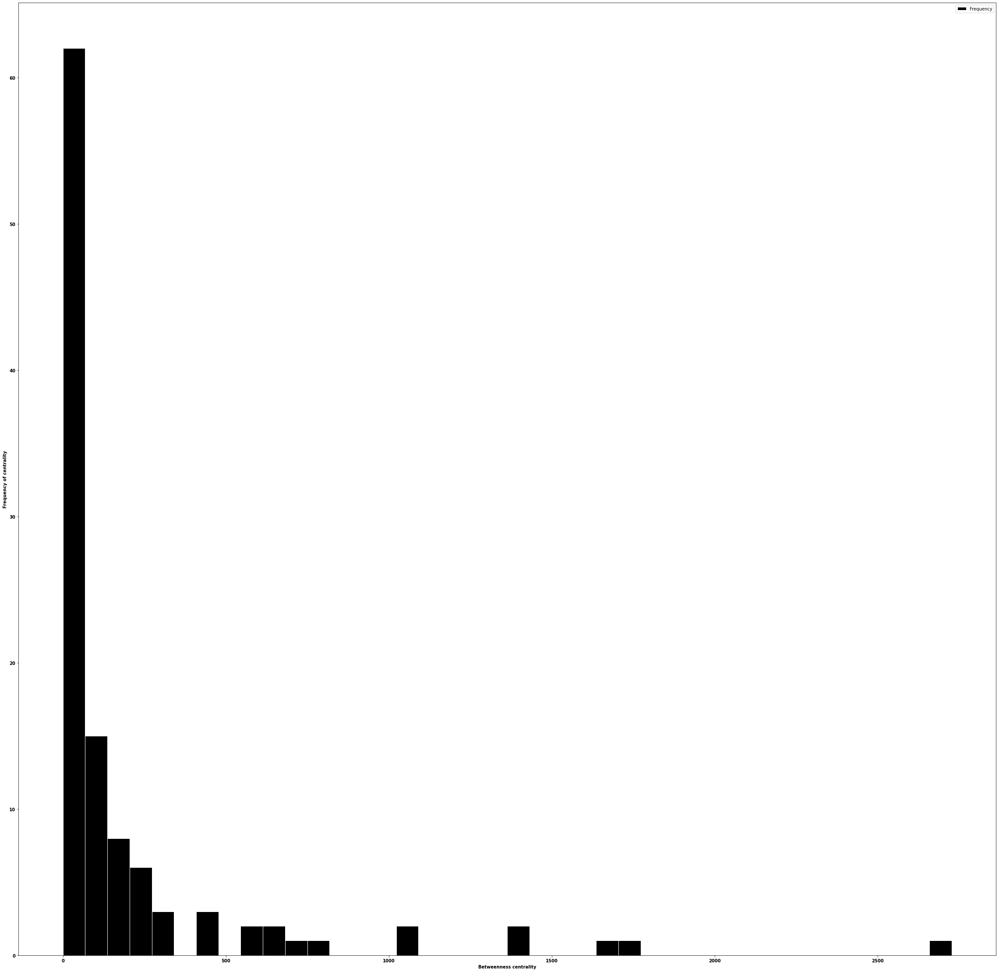

In [40]:
# betweenness centrality 
keys, values1 = zip(*bet_centrality.items())
print(values1)
#betweenness centrality power law
plt.hist(values1, bins=40,color='black',edgecolor='white')
plt.xlabel('Betweenness centrality',fontname='Times New Roman',weight="bold")
plt.ylabel('Frequency of centrality',fontname='Times New Roman',weight="bold")
plt.legend(['Frequency'])
plt.savefig('Betweenness centrality.pdf') 
plt.yticks(weight="bold")
plt.xticks(weight="bold")
plt.show()

In [44]:
print(values1)

(2726.9916666666663, 1641.1825396825388, 1034.1984126984125, 590.0, 43.5, 0.0, 1023.2777777777775, 13.5, 0.0, 0.0, 0.0, 0.0, 0.0, 104.17777777777779, 0.0, 23.5, 39.5, 21.2, 149.17857142857144, 165.5, 44.91666666666668, 154.6952380952381, 242.21666666666667, 0.0, 252.53809523809522, 123.16666666666667, 684.1333333333333, 159.5888888888889, 0.0, 1380.391666666667, 436.09999999999997, 800.0055555555554, 69.2, 0.0, 20.283333333333335, 114.28571428571429, 1413.0285714285717, 545.7333333333333, 0.0, 2.5, 233.70000000000002, 118.59444444444443, 275.85, 197.66666666666669, 130.5, 0.0, 16.5, 0.0, 0.0, 0.0, 0.0, 625.4880952380952, 0.0, 0.0, 630.7333333333332, 46.5, 0.0, 0.0, 0.0, 0.0, 0.0, 13.338888888888889, 117.76190476190474, 1766.8972222222214, 162.4333333333333, 0.0, 277.968253968254, 110.5595238095238, 17.45, 99.29999999999998, 195.6666666666667, 134.25, 124.28333333333332, 6.333333333333334, 91.70000000000002, 460.5912698412698, 446.75000000000006, 11.0, 35.28333333333333, 0.0, 7.83333333

In [43]:
import pandas as pd
df = pd.DataFrame(values1)
df.head()
#df.to_excel('between_centrality.xls')

,0
0,2726.991667
1,1641.182540
2,1034.198413
3,590.000000
4,43.500000


In [ ]:
pip install sklearn


  Created wheel for sklearn: filename=sklearn-0.0-py2.py3-none-any.whl size=1309 sha256=78dd46529135b0253815cb4f61fae8ca2b021972fafff425b1f85cdcadd97b72
  Stored in directory: c:\users\hp\appdata\local\pip\cache\wheels\e4\7b\98\b6466d71b8d738a0c547008b9eb39bf8676d1ff6ca4b22af1c
Successfully built sklearn
